In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
from scipy.stats import pearsonr
import seaborn as sns
import HERGAST
import torch
import torch.nn as nn
import torch.optim as optim
import anndata as ad
from tqdm import tqdm
import time
from scipy.stats import rankdata
import random
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True 
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False

plt.rcParams["figure.figsize"] = (9, 8)

# helper functions
def plot_gene_dist(adata,i,layer=None,num_bin=30,save=None):

    if layer is not None:
        df = pd.DataFrame({'value':adata.layers[layer][:,i],'mark':adata.obs['mark_area'].to_list()})
    else:
        df = pd.DataFrame({'value':adata.X[:,i],'mark':adata.obs['mark_area'].to_list()})
    
    # 设置绘图风格
    sns.set_theme(style="white")
    palette = {
    '0': '#6384BA',
    '1': '#E39C73'
    }

    plt.figure(figsize=(9, 6))
    sns.histplot(data=df, x='value', hue='mark', bins=num_bin, alpha=0.5, element='step',common_norm=False, stat='density',palette=palette)
    
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(True)
    plt.gca().spines['bottom'].set_visible(True)
    plt.legend().set_visible(False)
    plt.xlabel('')
    plt.ylabel('')

    if save is not None:
        plt.savefig(save)
    else:
        plt.show()

def min_max_norm(data):
    # Min-Max 
    min_vals = data.min(axis=0)  
    max_vals = data.max(axis=0)  
    normalized_data = (data - min_vals) / (max_vals - min_vals)
    return normalized_data

def compute_all_metrics(Y_true, Y_pred):
    if hasattr(Y_true, "toarray"): Y_true = Y_true.toarray()
    if hasattr(Y_pred, "toarray"): Y_pred = Y_pred.toarray()
    def vectorized_pcc(X, Y):
        X_centered = X - X.mean(axis=0)
        Y_centered = Y - Y.mean(axis=0)
        numerator = np.sum(X_centered * Y_centered, axis=0)
        denominator = np.sqrt(np.sum(X_centered**2, axis=0)) * np.sqrt(np.sum(Y_centered**2, axis=0))
        return numerator / (denominator + 1e-12) #
    
    pcc_per_gene = vectorized_pcc(Y_true, Y_pred)
    
    Y_true_ranked = np.apply_along_axis(rankdata, 0, Y_true)
    Y_pred_ranked = np.apply_along_axis(rankdata, 0, Y_pred)
    spcc_per_gene = vectorized_pcc(Y_true_ranked, Y_pred_ranked)

    return np.mean(pcc_per_gene), np.mean(spcc_per_gene),pcc_per_gene, spcc_per_gene

def error_metrics(gt_norm, pred_norm):
    # gt/pred: (N, G)
    err = pred_norm - gt_norm
    rmse = np.sqrt(np.mean(err**2))
    mae  = np.mean(np.abs(err))
    # per gene
    gene_rmse = np.sqrt(np.mean(err**2, axis=0))
    gene_mae  = np.mean(np.abs(err), axis=0)
   
    return rmse, mae, gene_rmse, gene_mae

In [2]:
set_seed(7)

================================== pattern:pattern7  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:06<00:00,  1.58it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8363 (Higher is better)    | 0.3352
SPCC       | 0.3886 (Higher is better)    | 0.2474
RMSE       | 0.2697 (Lower is better)     | 0.4144
MAE        | 0.2524 (Lower is better)     | 0.3905
================================== pattern:pattern8  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:07<00:00,  1.57it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.7983 (Higher is better)    | 0.2475
SPCC       | 0.1930 (Higher is better)    | 0.1640
RMSE       | 0.2501 (Lower is better)     | 0.4427
MAE        | 0.2304 (Lower is better)     | 0.4237
================================== pattern:pattern4  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:07<00:00,  1.57it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8457 (Higher is better)    | 0.3727
SPCC       | 0.4965 (Higher is better)    | 0.2944
RMSE       | 0.2696 (Lower is better)     | 0.4054
MAE        | 0.2524 (Lower is better)     | 0.3786
================================== pattern:pattern2  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:06<00:00,  1.58it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8320 (Higher is better)    | 0.3368
SPCC       | 0.3932 (Higher is better)    | 0.2494
RMSE       | 0.3047 (Lower is better)     | 0.4093
MAE        | 0.2823 (Lower is better)     | 0.3855
================================== pattern:pattern5  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:07<00:00,  1.57it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8620 (Higher is better)    | 0.3334
SPCC       | 0.3839 (Higher is better)    | 0.2452
RMSE       | 0.2537 (Lower is better)     | 0.4173
MAE        | 0.2295 (Lower is better)     | 0.3937
================================== pattern:pattern6  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:06<00:00,  1.57it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8790 (Higher is better)    | 0.3342
SPCC       | 0.3842 (Higher is better)    | 0.2462
RMSE       | 0.2169 (Lower is better)     | 0.4088
MAE        | 0.1781 (Lower is better)     | 0.3849
================================== pattern:pattern1  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:06<00:00,  1.58it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8863 (Higher is better)    | 0.4146
SPCC       | 0.6246 (Higher is better)    | 0.3578
RMSE       | 0.2578 (Lower is better)     | 0.3840
MAE        | 0.2111 (Lower is better)     | 0.3528
================================== pattern:pattern3  ===================================


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [02:06<00:00,  1.58it/s]



Metric     | Reconstructed (HERGAST) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8485 (Higher is better)    | 0.2899
SPCC       | 0.2762 (Higher is better)    | 0.2005
RMSE       | 0.2473 (Lower is better)     | 0.4319
MAE        | 0.2231 (Lower is better)     | 0.4109


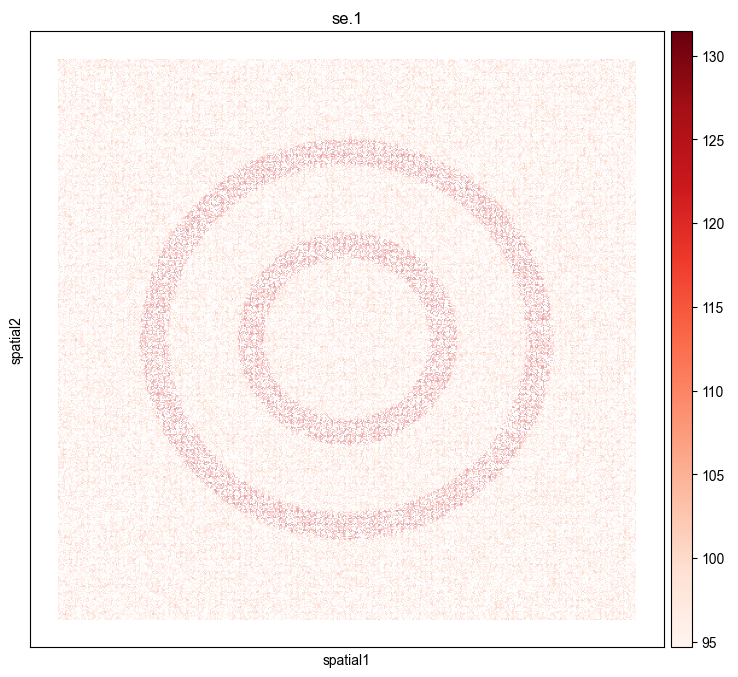

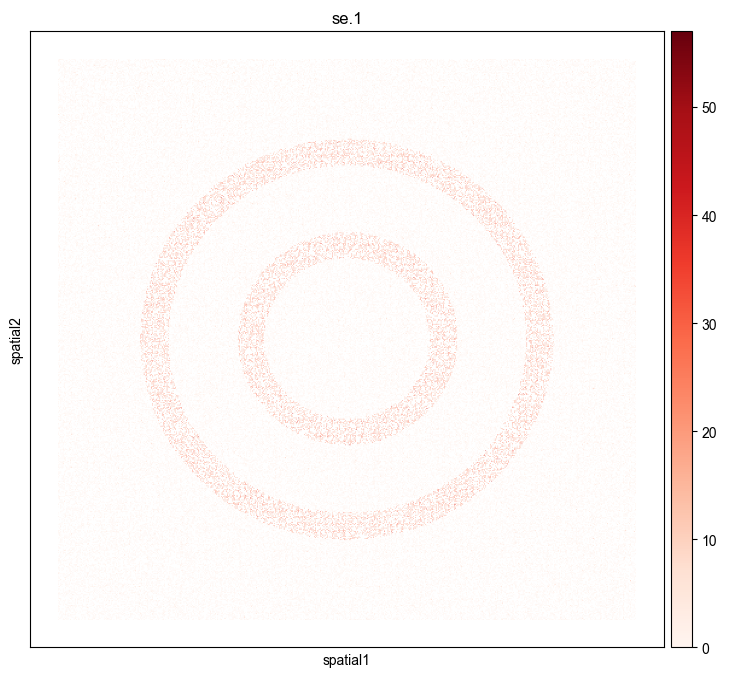

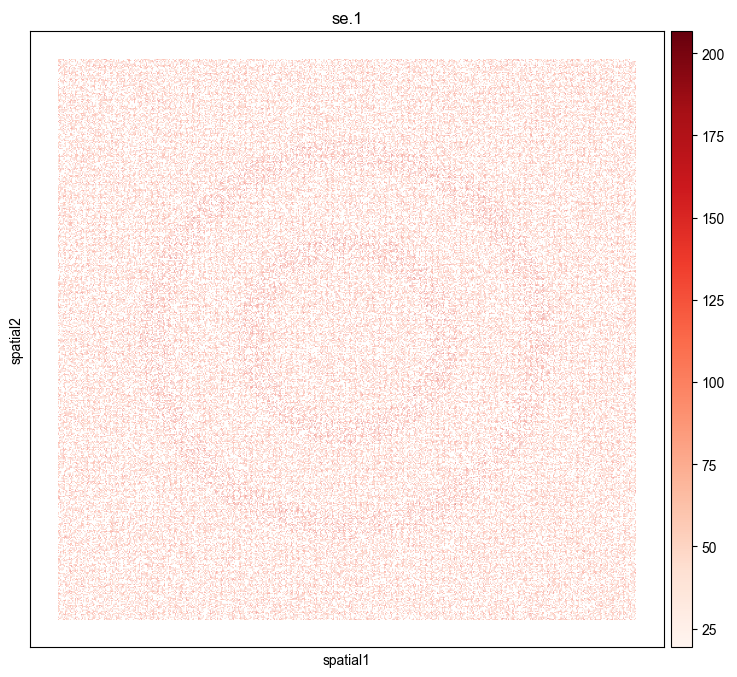

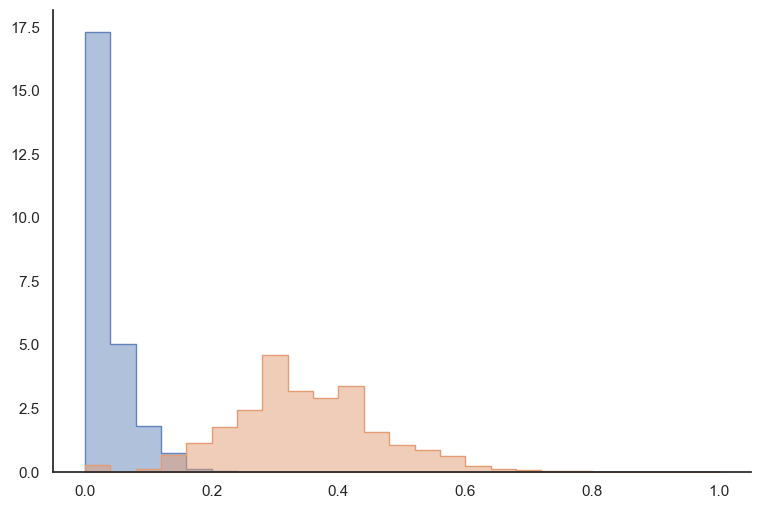

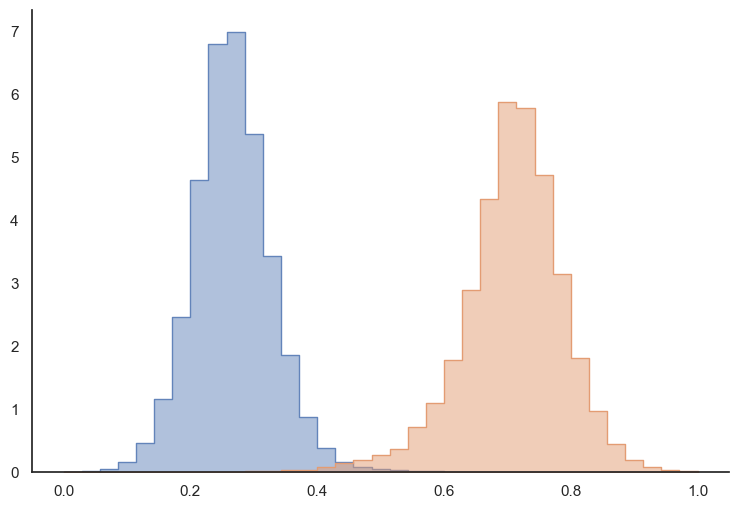

...

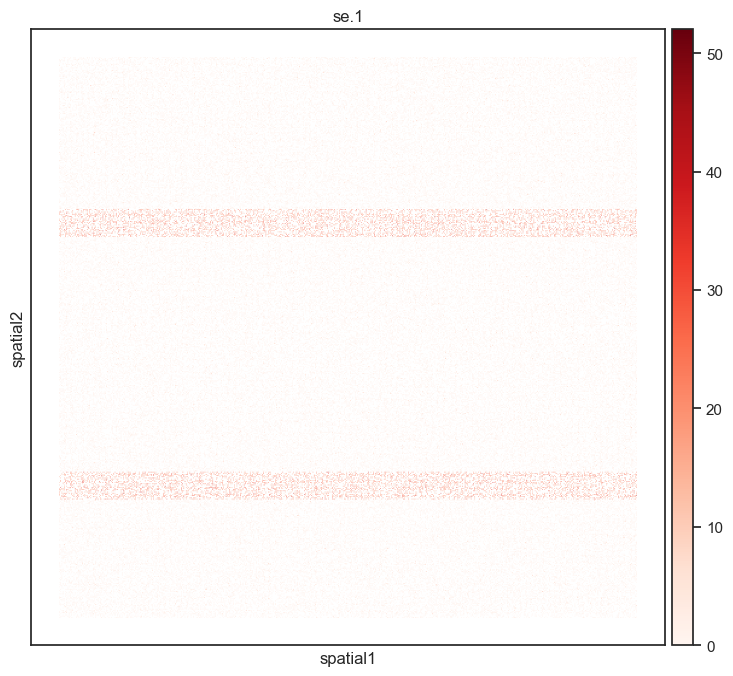

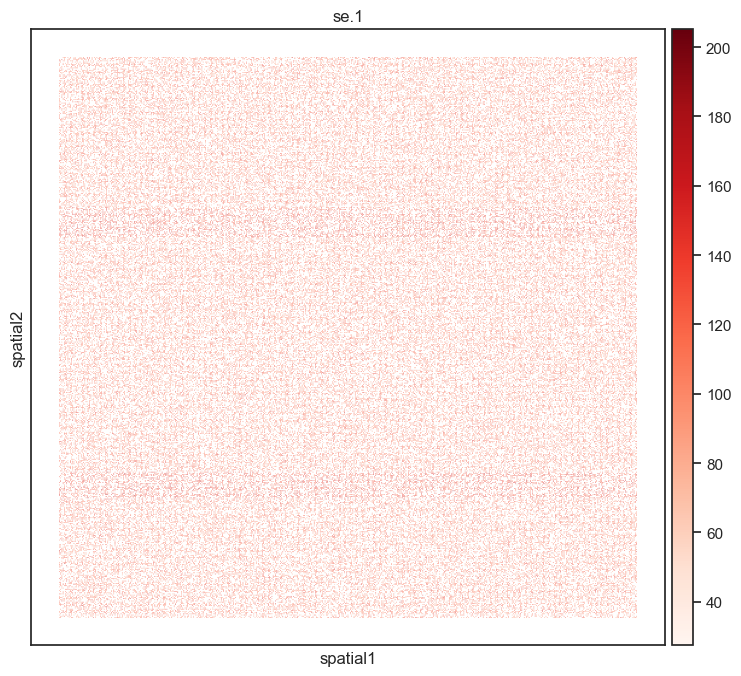

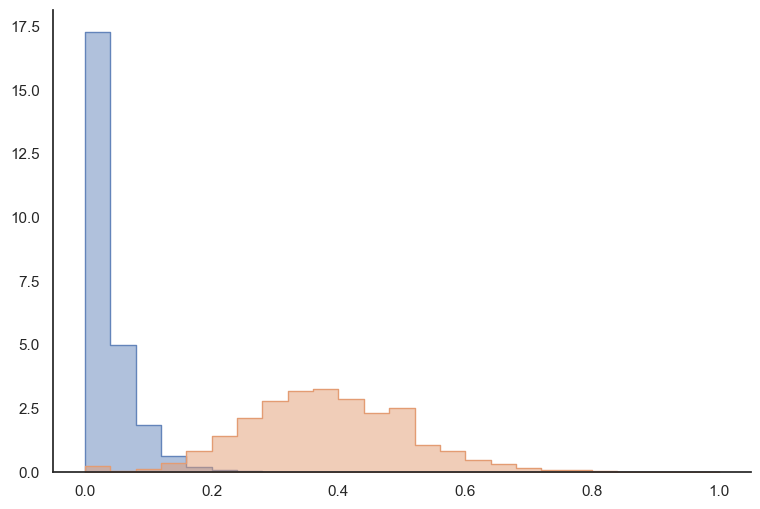

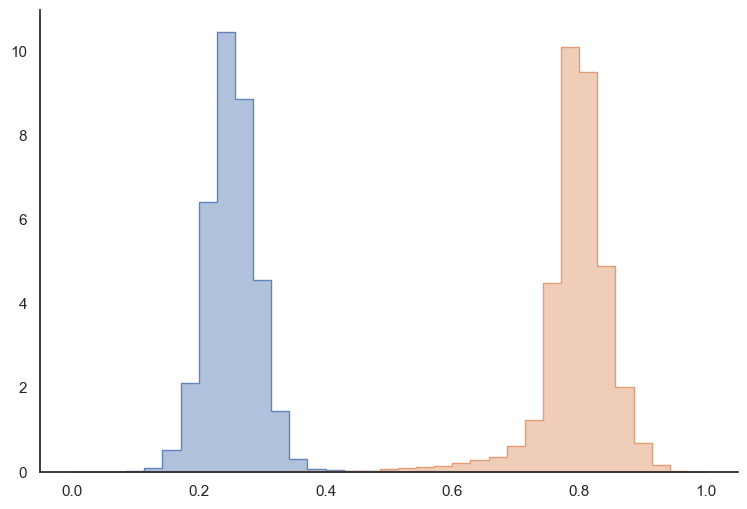

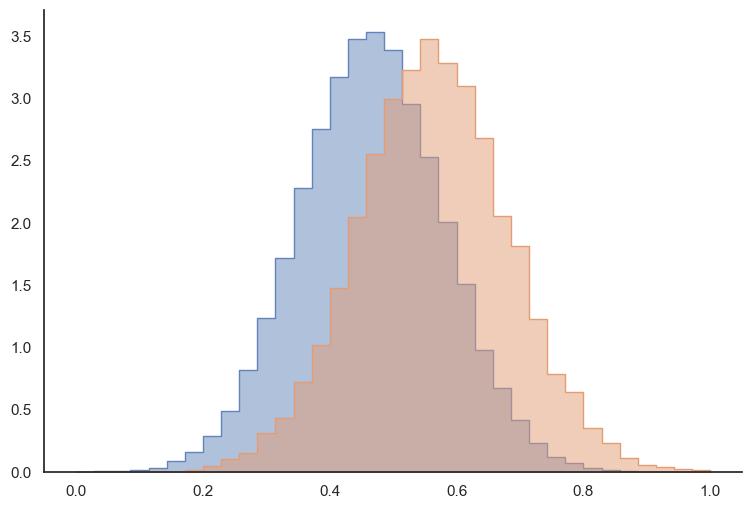

In [3]:
dist_mapping={'0':'ZIP','1':'ZINB'}
dist = dist_mapping['1']
patterns = [f for f in os.listdir('.') if f.endswith('.png')]
device= torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
for ptn in patterns:
    res_dir = ptn.split('.')[0]
    print(f'================================== pattern:{res_dir}  ===================================')
    res_dir = f'{dist}/{res_dir}'
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    current_img_dir = '.' 
    if dist=='ZINB':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZINB',ptn=ptn,png_dir=current_img_dir, se_mu=20,se_size=20,ns_mu=2,ns_size=2,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X
        mean = 20  # noise mean
        stddev = 20  # noise std
        noise = np.random.normal(mean, stddev, adata.shape)
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
        
    elif dist=='ZIP':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZIP',ptn=ptn,png_dir=current_img_dir, se_mu=15,ns_mu=3,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X
        mean = 15  
        stddev = 15 
        noise = np.random.normal(mean, stddev, adata.shape)
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
    adata.layers['noise'] = adata.X

    #HERGAST model
    HERGAST.utils.Cal_Spatial_Net(adata,verbose=False)
    HERGAST.utils.Cal_Expression_Net(adata,verbose=False)

    train_HERGAST = HERGAST.Train_HERGAST(adata, batch_data=True, num_batch_x_y=(4,4), spatial_net_arg={'verbose':False},exp_net_arg={'verbose':False},dim_reduction=None,device_idx=0)
    train_HERGAST.train_HERGAST(n_epochs=200,save_reconstrction=True)
    
    #Evaluation
    adata.layers['rex'] = adata.obsm['HERGAST_ReX']
    adata.layers['gt_norm'] = min_max_norm(adata.layers['gt'])
    adata.layers['rex_norm'] = min_max_norm(adata.layers['rex'])
    adata.layers['noise_norm'] = min_max_norm(adata.layers['noise'])
    gt_data = adata.layers['gt'][:, :50]
    rex_data = adata.layers['rex'][:, :50]
    noise_data = adata.layers['noise'][:, :50]

    gt_norm_data = adata.layers['gt_norm'][:, :50]
    rex_norm_data = adata.layers['rex_norm'][:, :50]
    noise_norm_data = adata.layers['noise_norm'][:, :50]
    
    # 2.  Reconstructed (Rex) vs Ground Truth
    rex_pcc, rex_spcc,pcc_per_gene, spcc_per_gene = compute_all_metrics(gt_data, rex_data)
    noise_pcc, noise_spcc,noise_pcc_per_gene,noise_spcc_per_gene = compute_all_metrics(gt_data, noise_data)
    rmse, mae, rmse_per_gene, mae_per_gene=error_metrics(gt_norm_data,rex_norm_data)
    noise_rmse, noise_mae, noise_rmse_per_gene, noise_mae_per_gene=error_metrics(gt_norm_data,noise_norm_data)
    
    print(f"\n{'Metric':<10} | {'Reconstructed (HERGAST)':<22} | {'Noisy Input':<22}")
    print("-" * 60)
    print(f"{'PCC':<10} | {rex_pcc:.4f}{' (Higher is better)':<22} | {noise_pcc:.4f}")
    print(f"{'SPCC':<10} | {rex_spcc:.4f}{' (Higher is better)':<22} | {noise_spcc:.4f}")
    print(f"{'RMSE':<10} | {rmse:.4f}{' (Lower is better)':<22} | {noise_rmse:.4f}")
    print(f"{'MAE':<10} | {mae:.4f}{' (Lower is better)':<22} | {noise_mae:.4f}")
    
    
    rex_df = pd.DataFrame({"Methods": ["HERGAST"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": pcc_per_gene,"SPCC": spcc_per_gene,"RMSE":rmse_per_gene,"MAE":mae_per_gene,"pattern":res_dir},)
    noise_df = pd.DataFrame({"Methods": ["Noise"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": noise_pcc_per_gene,"SPCC": noise_spcc_per_gene,"RMSE":rmse_per_gene,"MAE":mae_per_gene,"pattern":res_dir})
    
    rex_df.to_csv(f"{res_dir}/HERGAST_rex_vs_gt_correlation.csv", index=False)
    noise_df.to_csv(f"{res_dir}/noise_vs_gt_correlation.csv", index=False)
    
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='rex',show=False)
    plt.savefig(f'{res_dir}/HERGAST_svg_sp_rex.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='gt',show=False)
    plt.savefig(f'{res_dir}/HERGAST_svg_sp_gt.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='noise',show=False)
    plt.savefig(f'{res_dir}/HERGAST_svg_sp_noise.png')

    plot_gene_dist(adata,0,num_bin=25,layer='gt_norm',save=f'{res_dir}/gt_svg_dist_gt.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='rex_norm',save=f'{res_dir}/HERGAST_svg_dist_rex.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='noise_norm',save=f'{res_dir}/Noise_svg_dist_noise.svg')